  <tr>
        <td>
            <div align="left">
                <font size=25px>
                    <b>Predicting Life Expectancy
                    </b>
                </font>
            </div>
        </td>
    </tr>

## Problem Statement:
The data-set related to life expectancy, health factors for 193 countries has been collected from the same WHO data repository website and its corresponding economic data was collected from United Nation website. Among all categories of health-related factors only those critical factors were chosen which are more representative. It has been observed that in the past 15 years , there has been a huge development in health sector resulting in improvement of human mortality rates especially in the developing nations in comparison to the past 30 years. Therefore, in this project we have considered data from year 2000-2015 for 193 countries for further analysis.

## Data Definition:

<i>Input variables:</i>


1. **Country** Country names
2. **Year**	 Year of data recorded
3. **Status**	Developed or Developing status
4. **Adult Mortality**	Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)
5. **infant deaths** Number of Infant Deaths per 1000 population
6. **Alcohol**	Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol)
7. **percentage expenditure**	Expenditure on health as a percentage of Gross Domestic Product per capita(%)
8. **Hepatitis B**	Hepatitis B (HepB) immunization coverage among 1-year-olds (%)
9. **Measles**	number of reported cases per 1000 population
10. **BMI**	Average Body Mass Index of entire population
11. **under-five deaths** Number of under-five deaths per 1000 population

12. **Polio**	Polio (Pol3) immunization coverage among 1-year-olds (%)

13. **Total expenditure**	General government expenditure on health as a percentage of total government expenditure (%)

14. **Diphtheria**	Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)

15. **HIV/AIDS**Deaths per 1 000 live births HIV/AIDS (0-4 years)

16. **GDP**	Gross Domestic Product per capita (in USD)

17. **Population**	Population of the country

18. **thinness 1-19 years**	Prevalence of thinness among children and adolescents for Age 10 to 19 (% )

19. **thinness 5-9 years**	Prevalence of thinness among children for Age 5 to 9(%)

20. **Income composition of resources**	Human Development Index in terms of income composition of resources (index ranging from 0 to 1)

21. **Schooling**	Number of years of Schooling(years)


<i>Output variable (desired target):</i>

22. **Life expectancy**	(target) Life Expectancy in age



1. **[Import Packages](#import_packages)**
2. **[Create spark session](#Create_spark_session)**
3. **[Read Data](#Read_Data)**
4. **[Understand and Prepare the Data](#data_preparation)**
    - 4.1 - [Data Types and Dimensions](#Data_Types)
    - 4.2 - [Statistical Summary](#Statistical_Summary)
    - 4.3 - [Dealing with missing values](#Dealing_with_missing_values)
5. **[EDA](#EDA)**
6. **[Correlation](#Correlation)**
7. **[Data Transformation](#Data_Transformation)**
8. **[Linear Regression](#Linear_Regression)**
    - 8.1 - [Split the data](#Split_the_data)
    - 8.2 - [Build the model](#Build_the_model)
    - 8.3 - [Make predictions](#Make_predictions)
    - 8.4 - [Performance measures](#Performance_measures)
    - 8.5 - [Tabulate Result](#Tabulate_Result)    
9. **[Conclusion](#model_cmp)**  

<a id='import_packages'></a>
## 1. Import Packages

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import seaborn as sns
# pyspark 
import pyspark 
from pyspark.sql import SparkSession 
from pyspark.sql.functions import isnan, when, count, col
from pyspark.sql import SQLContext
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import MinMaxScaler
from pyspark.ml import Pipeline
from pyspark.ml.regression import LinearRegression

# import plotly
import plotly.express as px

# import linear model
from sklearn import linear_model

import scipy.stats as stats

sns.set()

<a id='Create_spark_session'></a>
## 2. Create spark session

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>SparkSession can be construed as gateway to spark libraries using SparkSession()<br> 
                </font>
            </div>
        </td>
    </tr>
</table>

In [17]:
#create instance of spark class 
spark=SparkSession.builder.appName('Life_Expectancy_Data').getOrCreate()
  

In [18]:
spark

In [19]:
# Enable Arrow-based columnar data transfers
spark.conf.set("spark.sql.execution.arrow.enabled", "false")

<a id='Read_Data'></a>
## 3. Read the Data

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>Read the data using read.csv() function from pandas<br> 
                </font>
            </div>
        </td>
    </tr>
</table>

In [20]:
#create spark dataframe of input csv file 
raw_data=spark.read.csv('Life_Expectancy_Data.csv'
                  ,inferSchema=True,header=True) 
raw_data.head(2) 

[Row(Country='Afghanistan', Year=2015, Status='Developing', Life expectancy =65.0, Adult Mortality=263, infant deaths=62, Alcohol=0.01, percentage expenditure=71.27962362, Hepatitis B=65, Measles =1154,  BMI =19.1, under-five deaths =83, Polio=6, Total expenditure=8.16, Diphtheria =65,  HIV/AIDS=0.1, GDP=584.25921, Population=33736494.0,  thinness  1-19 years=17.2,  thinness 5-9 years=17.3, Income composition of resources=0.479, Schooling=10.1),
 Row(Country='Afghanistan', Year=2014, Status='Developing', Life expectancy =59.9, Adult Mortality=271, infant deaths=64, Alcohol=0.01, percentage expenditure=73.52358168, Hepatitis B=62, Measles =492,  BMI =18.6, under-five deaths =86, Polio=58, Total expenditure=8.18, Diphtheria =62,  HIV/AIDS=0.1, GDP=612.696514, Population=327582.0,  thinness  1-19 years=17.5,  thinness 5-9 years=17.5, Income composition of resources=0.476, Schooling=10.0)]

<a id='data_preparation'></a>
## 4. Understand and Prepare the Data

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>The process of data preparation entails cleansing, structuring and integrating data to make it ready for analysis. <br><br>
                        Here we will analyze and prepare data :<br>
                        1. Check dimensions and data types of the dataframe <br>
                        2. Statistical Summary<br> 
                        3. Data Cleaning<br> 
                        4. Dealing with outliers<br>
                                       </b>
                </font>
            </div>
        </td>
    </tr>
</table>

<a id='Data_Types'></a>
## 4.1 Data Types and Dimensions

In [21]:
type(raw_data)


pyspark.sql.dataframe.DataFrame

In [22]:
raw_data.describe()

DataFrame[summary: string, Country: string, Year: string, Status: string, Life expectancy : string, Adult Mortality: string, infant deaths: string, Alcohol: string, percentage expenditure: string, Hepatitis B: string, Measles : string,  BMI : string, under-five deaths : string, Polio: string, Total expenditure: string, Diphtheria : string,  HIV/AIDS: string, GDP: string, Population: string,  thinness  1-19 years: string,  thinness 5-9 years: string, Income composition of resources: string, Schooling: string]

In [23]:
# print schema
raw_data.printSchema()

root
 |-- Country: string (nullable = true)
 |-- Year: integer (nullable = true)
 |-- Status: string (nullable = true)
 |-- Life expectancy : double (nullable = true)
 |-- Adult Mortality: integer (nullable = true)
 |-- infant deaths: integer (nullable = true)
 |-- Alcohol: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Hepatitis B: integer (nullable = true)
 |-- Measles : integer (nullable = true)
 |--  BMI : double (nullable = true)
 |-- under-five deaths : integer (nullable = true)
 |-- Polio: integer (nullable = true)
 |-- Total expenditure: double (nullable = true)
 |-- Diphtheria : integer (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- GDP: double (nullable = true)
 |-- Population: double (nullable = true)
 |--  thinness  1-19 years: double (nullable = true)
 |--  thinness 5-9 years: double (nullable = true)
 |-- Income composition of resources: double (nullable = true)
 |-- Schooling: double (nullable = true)



In [24]:
# Column Names
print("\nColumn names :", raw_data.columns)
# Row Count
print("\nNumber of Rows :",raw_data.count()) 
# Column Count
print("\nNumber of features :", len(raw_data.columns))


Column names : ['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling']

Number of Rows : 2938

Number of features : 22


**We see the dataframe has 22 columns and 2938 observations**

<a id='Statistical_Summary'></a>
## 4.2. Statistical Summary
Here we take a look at the summary of each attribute. This includes the count, mean, the min and max values as well as some percentiles for numeric variables.

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b> In our dataset we have numerical variables. Now we check for summary statistics of all the variables<br>
                        For numerical variables, we use .describe().show(). For categorical variables we use describe(include='object').
          <br>
                    </b>
                </font>
            </div>
        </td>
    </tr>
</table>

In [25]:
raw_data.describe(['Adult Mortality', 'infant deaths', 'Alcohol', 'percentage expenditure']).show()

+-------+------------------+------------------+------------------+----------------------+
|summary|   Adult Mortality|     infant deaths|           Alcohol|percentage expenditure|
+-------+------------------+------------------+------------------+----------------------+
|  count|              2928|              2938|              2744|                  2938|
|   mean|164.79644808743168|30.303948264125257|4.6028607871720375|     738.2512954533823|
| stddev| 124.2920790034219|117.92650131339906| 4.052412658755658|     1987.914858016194|
|    min|                 1|                 0|              0.01|                   0.0|
|    max|               723|              1800|             17.87|           19479.91161|
+-------+------------------+------------------+------------------+----------------------+



In [26]:
raw_data.describe(['Hepatitis B', 'Measles ', ' BMI ', 'under-five deaths ', 'Polio']).show()

+-------+------------------+------------------+------------------+------------------+------------------+
|summary|       Hepatitis B|          Measles |              BMI |under-five deaths |             Polio|
+-------+------------------+------------------+------------------+------------------+------------------+
|  count|              2385|              2938|              2904|              2938|              2919|
|   mean| 80.94046121593291|2419.5922396187884| 38.32124655647373|  42.0357385976855| 82.55018842069202|
| stddev|25.070015593018063| 11467.27248923461|20.044033502562083| 160.4455484057337|23.428045949468476|
|    min|                 1|                 0|               1.0|                 0|                 3|
|    max|                99|            212183|              87.3|              2500|                99|
+-------+------------------+------------------+------------------+------------------+------------------+



In [27]:
raw_data.describe(['Total expenditure', 'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population']).show()

+-------+------------------+-----------------+------------------+------------------+--------------------+
|summary| Total expenditure|      Diphtheria |          HIV/AIDS|               GDP|          Population|
+-------+------------------+-----------------+------------------+------------------+--------------------+
|  count|              2712|             2919|              2938|              2490|                2286|
|   mean|5.9381895280235915|82.32408359027065|1.7421034717494939| 7483.158469138481|1.2753375120052498E7|
| stddev| 2.498319672155633| 23.7169120685726| 5.077784531086547|14270.169341515959| 6.101209650842794E7|
|    min|              0.37|                2|               0.1|           1.68135|                34.0|
|    max|              17.6|               99|              50.6|       119172.7418|       1.293859294E9|
+-------+------------------+-----------------+------------------+------------------+--------------------+



In [28]:
raw_data.describe([' thinness  1-19 years', ' thinness 5-9 years', 'Income composition of resources', 'Schooling']).show()

+-------+---------------------+-------------------+-------------------------------+------------------+
|summary| thinness  1-19 years| thinness 5-9 years|Income composition of resources|         Schooling|
+-------+---------------------+-------------------+-------------------------------+------------------+
|  count|                 2904|               2904|                           2771|              2775|
|   mean|   4.8397038567493205|  4.870316804407711|             0.6275510645976166|11.992792792792786|
| stddev|    4.420194947144322|  4.508882086983007|             0.2109035551515931|3.3589197211023554|
|    min|                  0.1|                0.1|                            0.0|               0.0|
|    max|                 27.7|               28.6|                          0.948|              20.7|
+-------+---------------------+-------------------+-------------------------------+------------------+



<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>The above output illustrates the summary statistics of all the numeric variables. we can clearly see outliers
                </b>     </font>
            </div>
        </td>
    </tr>
</table>

**Drop unneccesary columns**

In [29]:
data = raw_data.drop('Year')
data = data.drop('Country')

**Encoding Status feature - Developing : 0 and Developed : 1**

In [30]:
indexer = StringIndexer(inputCol="Status", outputCol="Status_encoded") 
data_encoded = indexer.fit(data).transform(data) 
data_encoded = data_encoded.drop('Status')
data_encoded.select('Status_encoded')

DataFrame[Status_encoded: double]

In [31]:
data_encoded.columns

['Life expectancy ',
 'Adult Mortality',
 'infant deaths',
 'Alcohol',
 'percentage expenditure',
 'Hepatitis B',
 'Measles ',
 ' BMI ',
 'under-five deaths ',
 'Polio',
 'Total expenditure',
 'Diphtheria ',
 ' HIV/AIDS',
 'GDP',
 'Population',
 ' thinness  1-19 years',
 ' thinness 5-9 years',
 'Income composition of resources',
 'Schooling',
 'Status_encoded']

<a id='Dealing_with_missing_values'></a>
## 4.3. Dealing with missing values

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>In order to handle missing values we will follow following steps:<br>
                        1. Convert spark dataframe to pandas<br>
                        2. Compute missing values using KNN imputer<br> 
                        3. Convert pandas dataframe back to spark sql dataframe<br> 
                                       </b>
                </font>
            </div>
        </td>
    </tr>
</table>

**Checking for Missing values**

In [32]:
data_encoded.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in data_encoded.columns]).show()

+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+---+----------+---------------------+-------------------+-------------------------------+---------+--------------+
|Life expectancy |Adult Mortality|infant deaths|Alcohol|percentage expenditure|Hepatitis B|Measles | BMI |under-five deaths |Polio|Total expenditure|Diphtheria | HIV/AIDS|GDP|Population| thinness  1-19 years| thinness 5-9 years|Income composition of resources|Schooling|Status_encoded|
+----------------+---------------+-------------+-------+----------------------+-----------+--------+-----+------------------+-----+-----------------+-----------+---------+---+----------+---------------------+-------------------+-------------------------------+---------+--------------+
|              10|             10|            0|    194|                     0|        553|       0|   34|                 0|   19|           

<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>There are missing values in the dataset</b>     </font>
            </div>
        </td>
    </tr>
</table>

**Since there are missing values we need to handle them. We will be doing that by converting spark sql dataframe to pandas dataframe**

In [33]:
pandas_df = data_encoded.toPandas()
pandas_df.head()

,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Status_encoded
0,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,0.0
1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0.0
2,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,0.0
3,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,0.0
4,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,0.0


Let's again check missing values 

In [34]:
pandas_df.isna().sum()

Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
 BMI                                34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
 HIV/AIDS                            0
GDP                                448
Population                         652
 thinness  1-19 years               34
 thinness 5-9 years                 34
Income composition of resources    167
Schooling                          163
Status_encoded                       0
dtype: int64

In [35]:
pandas_df.shape

(2938, 20)

**Dataset has lot's of missing values and all missing values are in numeric features.**<br>
So extracting only missing values

In [36]:
# Create a list of features with missing values
missing_features = ['Life expectancy ' , 'Adult Mortality','Alcohol','Hepatitis B',' BMI ','Polio','Total expenditure','Diphtheria ','GDP','Population',' thinness  1-19 years',
                   ' thinness 5-9 years','Income composition of resources','Schooling'] 

**Create a function that replaces the missing values with some random observed values of the variable.**<br> 
This method is repeated for all the variables containing missing values, after which they serve as parameters in the regression model to estimate other variable values.



In [37]:
def random_imputation(df, feature):

    number_missing = df[feature].isnull().sum()
    observed_values = df.loc[df[feature].notnull(), feature]
    df.loc[df[feature].isnull(), feature + '_imp'] = np.random.choice(observed_values, number_missing, replace = True)
    
    return df

In [38]:
pandas_df_1 = pandas_df.copy(deep = True)
for feature in missing_features:
    pandas_df_1[feature + '_imp'] = pandas_df_1[feature]
    pandas_df_1 = random_imputation(pandas_df_1, feature)
pandas_df_1.head()

,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,...,BMI _imp,Polio_imp,Total expenditure_imp,Diphtheria _imp,GDP_imp,Population_imp,thinness 1-19 years_imp,thinness 5-9 years_imp,Income composition of resources_imp,Schooling_imp
0,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,...,19.1,6.0,8.16,65.0,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,...,18.6,58.0,8.18,62.0,612.696514,327582.0,17.5,17.5,0.476,10.0
2,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,...,18.1,62.0,8.13,64.0,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,...,17.6,67.0,8.52,67.0,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,...,17.2,68.0,7.87,68.0,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [39]:
# Creating a function of Stochastic Regression Imputation

def stochastic_regression_imputation(random_data , missing_columns,df):
    
    for feature in missing_columns:
        random_data["Ran" + feature] = df[feature + '_imp']
        parameters = list(set(df.columns) - set(missing_columns) - {feature + '_imp'})

        model = linear_model.LinearRegression()
        model.fit(X = df[parameters], y = df[feature + '_imp'])

        #Standard Error of the regression estimates is equal to std() of the errors of each estimates
        predict = model.predict(df[parameters])
        std_error = (predict[df[feature].notnull()] - df.loc[df[feature].notnull(), feature + '_imp']).std()

        #observe that I preserve the index of the missing data from the original dataframe
        random_predict = np.random.normal(size = df[feature].shape[0], 
                                          loc = predict, 
                                          scale = std_error)
        random_data.loc[(df[feature].isnull()) & (random_predict > 0), "Ran" + feature] = random_predict[(df[feature].isnull()) & (random_predict > 0)]
    return random_data
                                                                            

In [40]:
random_data = pd.DataFrame(columns = ["Ran" + name for name in missing_features])
pandas_df_2 = stochastic_regression_imputation(random_data,missing_features,pandas_df_1)
pandas_df_2.head()

,RanLife expectancy,RanAdult Mortality,RanAlcohol,RanHepatitis B,Ran BMI,RanPolio,RanTotal expenditure,RanDiphtheria,RanGDP,RanPopulation,Ran thinness 1-19 years,Ran thinness 5-9 years,RanIncome composition of resources,RanSchooling
0,65.0,263.0,0.01,65.0,19.1,6.0,8.16,65.0,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,59.9,271.0,0.01,62.0,18.6,58.0,8.18,62.0,612.696514,327582.0,17.5,17.5,0.476,10.0
2,59.9,268.0,0.01,64.0,18.1,62.0,8.13,64.0,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,59.5,272.0,0.01,67.0,17.6,67.0,8.52,67.0,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,59.2,275.0,0.01,68.0,17.2,68.0,7.87,68.0,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [41]:
pandas_df_2.isna().sum()

RanLife expectancy                    0
RanAdult Mortality                    0
RanAlcohol                            0
RanHepatitis B                        0
Ran BMI                               0
RanPolio                              0
RanTotal expenditure                  0
RanDiphtheria                         0
RanGDP                                0
RanPopulation                         0
Ran thinness  1-19 years              0
Ran thinness 5-9 years                0
RanIncome composition of resources    0
RanSchooling                          0
dtype: int64

<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>There are no missing values in the dataset except for target variable.It will be handle once pandas dataframe is converted into spark sql dataframe</b>     </font>
            </div>
        </td>
    </tr>
</table>

In [42]:
pandas_df_2.shape

(2938, 14)

Dataframe shape changes, so adding missing features

In [43]:
pandas_df_2['infant deaths'] = pandas_df['infant deaths']
pandas_df_2['percentage expenditure'] = pandas_df['percentage expenditure']
pandas_df_2['Measles '] = pandas_df['Measles ']
pandas_df_2['under-five deaths '] = pandas_df['under-five deaths ']
pandas_df_2[' HIV/AIDS'] = pandas_df[' HIV/AIDS']
pandas_df_2['Status_encoded'] = pandas_df['Status_encoded']
pandas_df_2.head()

,RanLife expectancy,RanAdult Mortality,RanAlcohol,RanHepatitis B,Ran BMI,RanPolio,RanTotal expenditure,RanDiphtheria,RanGDP,RanPopulation,Ran thinness 1-19 years,Ran thinness 5-9 years,RanIncome composition of resources,RanSchooling,infant deaths,percentage expenditure,Measles,under-five deaths,HIV/AIDS,Status_encoded
0,65.0,263.0,0.01,65.0,19.1,6.0,8.16,65.0,584.259210,33736494.0,17.2,17.3,0.479,10.1,62,71.279624,1154,83,0.1,0.0
1,59.9,271.0,0.01,62.0,18.6,58.0,8.18,62.0,612.696514,327582.0,17.5,17.5,0.476,10.0,64,73.523582,492,86,0.1,0.0
2,59.9,268.0,0.01,64.0,18.1,62.0,8.13,64.0,631.744976,31731688.0,17.7,17.7,0.470,9.9,66,73.219243,430,89,0.1,0.0
3,59.5,272.0,0.01,67.0,17.6,67.0,8.52,67.0,669.959000,3696958.0,17.9,18.0,0.463,9.8,69,78.184215,2787,93,0.1,0.0
4,59.2,275.0,0.01,68.0,17.2,68.0,7.87,68.0,63.537231,2978599.0,18.2,18.2,0.454,9.5,71,7.097109,3013,97,0.1,0.0


In [44]:
pandas_df_2.shape

(2938, 20)

**Convert pandas dataframe to spark sql dataframe**

In [45]:
data_no_na = spark.createDataFrame(pandas_df_2)
data_no_na.show(1)

+-------------------+------------------+----------+--------------+--------+--------+--------------------+--------------+---------+-------------+------------------------+----------------------+----------------------------------+------------+-------------+----------------------+--------+------------------+---------+--------------+
|RanLife expectancy |RanAdult Mortality|RanAlcohol|RanHepatitis B|Ran BMI |RanPolio|RanTotal expenditure|RanDiphtheria |   RanGDP|RanPopulation|Ran thinness  1-19 years|Ran thinness 5-9 years|RanIncome composition of resources|RanSchooling|infant deaths|percentage expenditure|Measles |under-five deaths | HIV/AIDS|Status_encoded|
+-------------------+------------------+----------+--------------+--------+--------+--------------------+--------------+---------+-------------+------------------------+----------------------+----------------------------------+------------+-------------+----------------------+--------+------------------+---------+--------------+
|      

<a id='EDA'></a>
## 5. EDA

<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>The process of EDA is to analysis the data.<br><br>
                        </b>
                </font>
            </div>
        </td>
    </tr>
</table>

In EDA we analyse feature in depth and try to extract some key insights from it. <br>
**Analysis is done by checking outliear, boxplot and histograms**

**Creating functions to plot boxplot, histograms**

In [46]:
def plot_box_plot_individual(data , feature):
    df = data.select(feature).toPandas()
    fig = px.box(df ,  points="all" , title = "Boxplot of " + feature)
    fig.show()
    


In [47]:
def plot_scatter_plot(data , features):
    df = data.select(features).toPandas()
    fig = px.scatter(df , x = features[0] , y=features[1] , title = f"Scatter plot of {features[0]} and {features[1]}" )
    fig.show()
    


In [48]:
def plot_hist_plot(data , feature):
    df = data.select(feature).toPandas()
    fig = px.histogram(df, x= feature , title="Histogram of " + feature)
    fig.show()
    


**1. Analysis of Life Expected**

In [49]:
data_df = data_no_na
feature = 'RanLife expectancy '


In [50]:
data_df.select(feature).summary().show()

+-------+-------------------+
|summary|RanLife expectancy |
+-------+-------------------+
|  count|               2938|
|   mean|  69.23591298941218|
| stddev|  9.518144906597705|
|    min|               36.3|
|    25%|               63.1|
|    50%|               72.1|
|    75%|               75.7|
|    max|               89.0|
+-------+-------------------+



In [51]:
plot_box_plot_individual(data=data_df,feature=feature)

In [52]:
plot_hist_plot(data=data_df , feature= feature)

**There are outliers at the lower end**

In [53]:
sqlContext = SQLContext(spark)
sqlContext.registerDataFrameAsTable(data_no_na,'mytable')
data1 = sqlContext.sql("SELECT * from mytable where `RanLife expectancy ` > 44.3")

In [54]:
plot_box_plot_individual(data1,feature=feature)

In [55]:
plot_hist_plot(data1,feature=feature)

**2. Analysis of Adult Mortality**

In [56]:
data_df = data1
feature = 'RanAdult Mortality'
features = ['RanAdult Mortality' , 'RanLife expectancy ']

In [57]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|RanAdult Mortality|
+-------+------------------+
|  count|              2926|
|   mean| 163.5691575061504|
| stddev|122.13337749067652|
|    min|               1.0|
|    25%|              74.0|
|    50%|             144.0|
|    75%|             226.0|
|    max|             717.0|
+-------+------------------+



In [58]:
plot_box_plot_individual(data=data_df,feature=feature)

In [59]:
plot_hist_plot(data=data_df , feature= feature)

In [60]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are few outliears
* We can see that as Life expectancy decrease as Adult mortality increases.


**3. Analysis of infant deaths**

In [61]:
data_df = data1
feature = 'infant deaths'
features = ['infant deaths' , 'RanLife expectancy ']

In [62]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|     infant deaths|
+-------+------------------+
|  count|              2926|
|   mean|30.285372522214626|
| stddev|118.16635631790851|
|    min|                 0|
|    25%|                 0|
|    50%|                 3|
|    75%|                21|
|    max|              1800|
+-------+------------------+



In [63]:
plot_box_plot_individual(data=data_df,feature=feature)

In [64]:
plot_hist_plot(data=data_df , feature= feature)

In [65]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are few outliears
* Majority of data is concentrated between 0 to 9 which means that probability of new born child dying before an year from birth is on average between 0 to 0.009
* Maximum two in thousand infant deaths occurs in a population of 1000
* Expected life is inversely related to infant death which is true in reality


**4. Analysis of Alcohol**

In [66]:
data_df = data1
feature = 'RanAlcohol'
features = ['RanAlcohol' , 'RanLife expectancy ']

In [67]:
data_df.select(feature).summary().show()

+-------+-----------------+
|summary|       RanAlcohol|
+-------+-----------------+
|  count|             2926|
|   mean|4.624715979388768|
| stddev|3.995209490720888|
|    min|             0.01|
|    25%|             1.02|
|    50%|             3.82|
|    75%|             7.64|
|    max|            17.87|
+-------+-----------------+



In [68]:
plot_box_plot_individual(data=data_df,feature=feature)

In [69]:
plot_hist_plot(data=data_df , feature= feature)

In [70]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are few outliears
* Majority of data is between 0 to 0.499 
* Expected life is not much related to Alcohol  


**Remove Outliers**

In [71]:
sqlContext = SQLContext(spark)
sqlContext.registerDataFrameAsTable(data1,'mytable')
data2 = sqlContext.sql("SELECT * from mytable where RanAlcohol < 17.31")

In [72]:
plot_box_plot_individual(data=data2 , feature=feature)

**5. Analysis of percentage expenditure**

In [73]:
data_df = data2
feature = 'percentage expenditure'
features = ['percentage expenditure' , 'RanLife expectancy ']

In [74]:
data_df.select(feature).summary().show()

+-------+----------------------+
|summary|percentage expenditure|
+-------+----------------------+
|  count|                  2924|
|   mean|      740.734590622414|
| stddev|    1992.0290468523635|
|    min|                   0.0|
|    25%|           4.484254579|
|    50%|           66.02236299|
|    75%|           442.3774869|
|    max|           19479.91161|
+-------+----------------------+



In [75]:
plot_box_plot_individual(data=data_df,feature=feature)

In [76]:
plot_hist_plot(data=data_df , feature= feature)

In [77]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are  outliears
* Expected life is not much related to percentage expenditure
* Majoirty of countries spend least expenditure on health as a percentage of Gross Domestic Product per capita(%)


**6. Analysis of Hepatitis B**

In [78]:
data_df = data2
feature = 'RanHepatitis B'
features = ['RanHepatitis B' , 'RanLife expectancy ']

In [79]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|    RanHepatitis B|
+-------+------------------+
|  count|              2924|
|   mean|  80.0684223252713|
| stddev|25.087929555646685|
|    min|0.7919266752308189|
|    25%|              73.0|
|    50%|              91.0|
|    75%|              96.0|
|    max|138.50373212203624|
+-------+------------------+



In [80]:
plot_box_plot_individual(data=data_df,feature=feature)

In [81]:
plot_hist_plot(data=data_df , feature= feature)

In [82]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears which can be removed by transformation
* Almost all children who get hepatitis B develop the long-term (chronic) condition and have lower life span.
* Expected life is related to Hepatitis B which is true in reality


**6. Analysis of Measles**

In [83]:
data_df = data2
feature = 'Measles '
features = ['Measles ' , 'RanLife expectancy ']

In [84]:
data_df.select(feature).summary().show()

+-------+-----------------+
|summary|         Measles |
+-------+-----------------+
|  count|             2924|
|   mean|2418.715800273598|
| stddev|11481.65834044047|
|    min|                0|
|    25%|                0|
|    50%|               16|
|    75%|              358|
|    max|           212183|
+-------+-----------------+



In [85]:
plot_box_plot_individual(data=data_df,feature=feature)

In [86]:
plot_hist_plot(data=data_df , feature= feature)

In [87]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* Measles can almost always be prevented with a vaccine.
* Measles doesnot effect Expected Life

**7. Analysis of BMI**

In [88]:
data_df = data2
feature = 'Ran BMI '
features = ['Ran BMI ' , 'RanLife expectancy ']

In [89]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|          Ran BMI |
+-------+------------------+
|  count|              2924|
|   mean| 38.20151689920519|
| stddev| 20.04833019694902|
|    min|0.6943765718232235|
|    25%|              19.3|
|    50%|              43.1|
|    75%|              56.1|
|    max|              87.3|
+-------+------------------+



In [90]:
plot_box_plot_individual(data=data_df,feature=feature)

In [91]:
plot_hist_plot(data=data_df , feature= feature)

In [92]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are no outliears
* We can clearly state that BMI effect expected life
* Average BMI lies between 19 to 54

**8. Analysis of under-five deaths**

In [93]:
data_df = data2
feature = 'under-five deaths '
features = ['under-five deaths ' , 'RanLife expectancy ']

In [94]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|under-five deaths |
+-------+------------------+
|  count|              2924|
|   mean|41.999316005471954|
| stddev|160.81969087305495|
|    min|                 0|
|    25%|                 0|
|    50%|                 4|
|    75%|                27|
|    max|              2500|
+-------+------------------+



In [95]:
plot_box_plot_individual(data=data_df,feature=feature)

In [96]:
plot_hist_plot(data=data_df , feature= feature)

In [97]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are no outliears
* Under five deaths doesn't effect Expected life
* Majority of deaths is 2000 

**9. Analysis of Polio**

In [98]:
data_df = data2
feature = 'RanPolio'
features = ['RanPolio' , 'RanLife expectancy ']

In [99]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|          RanPolio|
+-------+------------------+
|  count|              2924|
|   mean| 82.56445830057245|
| stddev|23.438994238553335|
|    min|               3.0|
|    25%|              78.0|
|    50%|              93.0|
|    75%|              97.0|
|    max|113.02075601140564|
+-------+------------------+



In [100]:
plot_box_plot_individual(data=data_df,feature=feature)

In [101]:
plot_hist_plot(data=data_df , feature= feature)

In [102]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears which can be removed by transformation
* Polio immunization can increase Expected Life if we avoid outliears


**10. Analysis of Total expenditure**

In [103]:
data_df = data2
feature = 'RanTotal expenditure'
features = ['RanTotal expenditure' , 'RanLife expectancy ']

In [104]:
data_df.select(feature).summary().show()

+-------+--------------------+
|summary|RanTotal expenditure|
+-------+--------------------+
|  count|                2924|
|   mean|  5.9160093665637135|
| stddev|   2.480496759380459|
|    min|  0.0440248243960184|
|    25%|                4.25|
|    50%|                5.75|
|    75%|                7.47|
|    max|                17.6|
+-------+--------------------+



In [105]:
plot_box_plot_individual(data=data_df,feature=feature)

In [106]:
plot_hist_plot(data=data_df , feature= feature)

In [107]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* We can remove these feature as it has no effect on expected life


**11. Analysis of Diphtheria**

In [108]:
data_df = data2
feature = 'RanDiphtheria '
features = ['RanDiphtheria ' , 'RanLife expectancy ']

In [109]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|    RanDiphtheria |
+-------+------------------+
|  count|              2924|
|   mean| 82.34231628435504|
| stddev| 23.69386661447273|
|    min|               2.0|
|    25%|              78.0|
|    50%|              93.0|
|    75%|              97.0|
|    max|116.64814675127283|
+-------+------------------+



In [110]:
plot_box_plot_individual(data=data_df,feature=feature)

In [111]:
plot_hist_plot(data=data_df , feature= feature)

In [112]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* Expected life is related to Diphtheria which is true in reality


**12. Analysis of HIV/AIDS**

In [113]:
data_df = data2
feature = ' HIV/AIDS'
features = [' HIV/AIDS' , 'RanLife expectancy ']

In [114]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|          HIV/AIDS|
+-------+------------------+
|  count|              2924|
|   mean|1.7022913816689398|
| stddev| 4.989785483153573|
|    min|               0.1|
|    25%|               0.1|
|    50%|               0.1|
|    75%|               0.7|
|    max|              50.6|
+-------+------------------+



In [115]:
plot_box_plot_individual(data=data_df,feature=feature)

In [116]:
plot_hist_plot(data=data_df , feature= feature)

In [117]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* Majority of data is concentrated between 0 to 0.4 which means that number of deaths due to HIV or AIDS is 0.00004% of 1000.
* We can say that Expected life decrease as HIV/AIDS death increases


**13. Analysis of GDP**

In [118]:
data_df = data2
feature = 'RanGDP'
features = ['RanGDP' , 'RanLife expectancy ']

In [119]:
data_df.select(feature).summary().show()

+-------+-----------------+
|summary|           RanGDP|
+-------+-----------------+
|  count|             2924|
|   mean| 7345.96738839181|
| stddev|13625.16161823479|
|    min|          1.68135|
|    25%|       522.951116|
|    50%|      2246.257472|
|    75%|      6764.722867|
|    max|      119172.7418|
+-------+-----------------+



In [120]:
plot_box_plot_individual(data=data_df,feature=feature)

In [121]:
plot_hist_plot(data=data_df , feature= feature)

In [122]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* We can see that Life Expectancy increase as GDP increases till a instance



**14. Analysis of Population**

In [123]:
data_df = data2
feature = 'RanPopulation'
features = ['RanPopulation' , 'RanLife expectancy ']

In [124]:
data_df.select(feature).summary().show()

+-------+-------------------+
|summary|      RanPopulation|
+-------+-------------------+
|  count|               2924|
|   mean| 1.66871556817259E7|
| stddev|5.683699541162335E7|
|    min|               34.0|
|    25%|           295195.0|
|    50%|          2182383.0|
|    75%|        1.4261494E7|
|    max|      1.293859294E9|
+-------+-------------------+



In [125]:
plot_box_plot_individual(data=data_df,feature=feature)

In [126]:
plot_hist_plot(data=data_df , feature= feature)

In [127]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are few outliears
* Population is not related to Expected life


**15. Analysis of thinness  1-19 years**

In [128]:
data_df = data2
feature = 'Ran thinness  1-19 years'
features = ['Ran thinness  1-19 years' , 'RanLife expectancy ']

In [129]:
data_df.select(feature).summary().show()

+-------+------------------------+
|summary|Ran thinness  1-19 years|
+-------+------------------------+
|  count|                    2924|
|   mean|       4.845112986686019|
| stddev|       4.411223458686249|
|    min|                     0.1|
|    25%|                     1.6|
|    50%|                     3.4|
|    75%|                     7.2|
|    max|                    27.7|
+-------+------------------------+



In [130]:
plot_box_plot_individual(data=data_df,feature=feature)

In [131]:
plot_hist_plot(data=data_df , feature= feature)

In [132]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* thinness 1-19 years is not continously distributed
* expected life is inversely related to thinness 1-19 years


**16. Analysis of thinness 5-9 years**

In [133]:
data_df = data2
feature = 'Ran thinness 5-9 years'
features = ['Ran thinness 5-9 years' , 'RanLife expectancy ']

In [134]:
data_df.select(feature).summary().show()

+-------+----------------------+
|summary|Ran thinness 5-9 years|
+-------+----------------------+
|  count|                  2924|
|   mean|     4.881288947077679|
| stddev|     4.519463805545646|
|    min|                   0.1|
|    25%|                   1.5|
|    50%|                   3.3|
|    75%|                   7.2|
|    max|                  28.6|
+-------+----------------------+



In [135]:
plot_box_plot_individual(data=data_df,feature=feature)

In [136]:
plot_hist_plot(data=data_df , feature= feature)

In [137]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* Majority of data is concentrated towards the left  
* expected life is inversely related to thinness 5-9 years


**17. Analysis of Income composition of resources**

In [138]:
data_df = data2
feature = 'RanIncome composition of resources'
features = ['RanIncome composition of resources' , 'RanLife expectancy ']

In [139]:
data_df.select(feature).summary().show()

+-------+----------------------------------+
|summary|RanIncome composition of resources|
+-------+----------------------------------+
|  count|                              2924|
|   mean|                0.6276351598323168|
| stddev|                0.2091517724997856|
|    min|                               0.0|
|    25%|                             0.496|
|    50%|                             0.675|
|    75%|                             0.778|
|    max|                0.9565548251643712|
+-------+----------------------------------+



In [140]:
plot_box_plot_individual(data=data_df,feature=feature)

In [141]:
plot_hist_plot(data=data_df , feature= feature)

In [142]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears, if this outliears are removed, we can see a clear relationship
* Majority of data is concentrated between 0.16 to 0.99 as Income Composition of resources increase expected life will increase
* expected life is directly related to Income composition of resources


**18. Analysis of Schooling**

In [143]:
data_df = data2
feature = 'RanSchooling'
features = ['RanSchooling' , 'RanLife expectancy ']

In [144]:
data_df.select(feature).summary().show()

+-------+------------------+
|summary|      RanSchooling|
+-------+------------------+
|  count|              2924|
|   mean|12.013289000467799|
| stddev| 3.342249649480013|
|    min|               0.0|
|    25%|              10.1|
|    50%|              12.3|
|    75%|              14.3|
|    max|              20.7|
+-------+------------------+



In [145]:
plot_box_plot_individual(data=data_df,feature=feature)

In [146]:
plot_hist_plot(data=data_df , feature= feature)

In [147]:
plot_scatter_plot(data=data_df,features=features)

**Conclusion from above analysis**

* There are outliears
* Schooling is normally distributed, if we avoid outliears
* There is linear relationship between expected life and Schooling


**19. Analysis of Status_encoded**

Label encoding for Status feature : Converting 'Developing' : 0 and 'Developed' : 1

In [148]:
data_df = data2
feature = 'Status_encoded'
features = ['Status_encoded' , 'RanLife expectancy ']

In [149]:
data_df.select(feature).summary().show()

+-------+-------------------+
|summary|     Status_encoded|
+-------+-------------------+
|  count|               2924|
|   mean|0.17510259917920656|
| stddev| 0.3801198422851495|
|    min|                0.0|
|    25%|                0.0|
|    50%|                0.0|
|    75%|                0.0|
|    max|                1.0|
+-------+-------------------+



In [150]:
plot_hist_plot(data=data_df , feature= feature)

/home/arun/VirtualEnv/my_env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



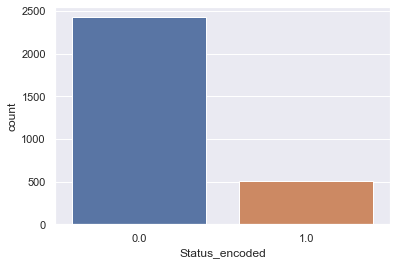

In [151]:
ax = sns.countplot(data_encoded.select('Status_encoded').toPandas()['Status_encoded'],label="Count")     

**Conclusion from above analysis**

* Status is distributed biasedly
* Developing is 2412
* Developed is 512 in count

<a id='Correlation'></a>
## 6. Correlation



<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                <b> In order to To check correlation and plot heatmap in spark<br></b>
                        1. Build a Vector Assembler in pyspark to merge all features into a single list<br>
                        2. Transform using dataframe using vector assembler<br>
                        3. Use corr() function of Correlation package to compute a correlation<br>
                        4. Convert this DenseMatrix object to list of array<br>
                        5. plot correlation heatmap using heatmap function of seaborn<br>
                </font>
            </div>
        </td>
    </tr>
</table>

**To check correlation in spark**
* Build a Vector Assembler in pyspark to merge all features into a single list
* Transform using dataframe using vector assembler
* Use corr() function of Correlation package to compute a correlation
* Convert this DenseMatrix object to list of array
* plot correlation heatmap using heatmap function of seaborn

In [152]:
assembler = VectorAssembler(inputCols=data2.columns, outputCol="features")
data_123 = assembler.transform(data2)
matrix = Correlation.corr(data_123, "features").collect()[0][0]
corrmatrix = matrix.toArray().tolist()


**Correlation among the features**

In [153]:
# check correlation
data_num = spark.createDataFrame(corrmatrix,data2.columns)
data_num.printSchema()

root
 |-- RanLife expectancy : double (nullable = true)
 |-- RanAdult Mortality: double (nullable = true)
 |-- RanAlcohol: double (nullable = true)
 |-- RanHepatitis B: double (nullable = true)
 |-- Ran BMI : double (nullable = true)
 |-- RanPolio: double (nullable = true)
 |-- RanTotal expenditure: double (nullable = true)
 |-- RanDiphtheria : double (nullable = true)
 |-- RanGDP: double (nullable = true)
 |-- RanPopulation: double (nullable = true)
 |-- Ran thinness  1-19 years: double (nullable = true)
 |-- Ran thinness 5-9 years: double (nullable = true)
 |-- RanIncome composition of resources: double (nullable = true)
 |-- RanSchooling: double (nullable = true)
 |-- infant deaths: double (nullable = true)
 |-- percentage expenditure: double (nullable = true)
 |-- Measles : double (nullable = true)
 |-- under-five deaths : double (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- Status_encoded: double (nullable = true)



<AxesSubplot:>

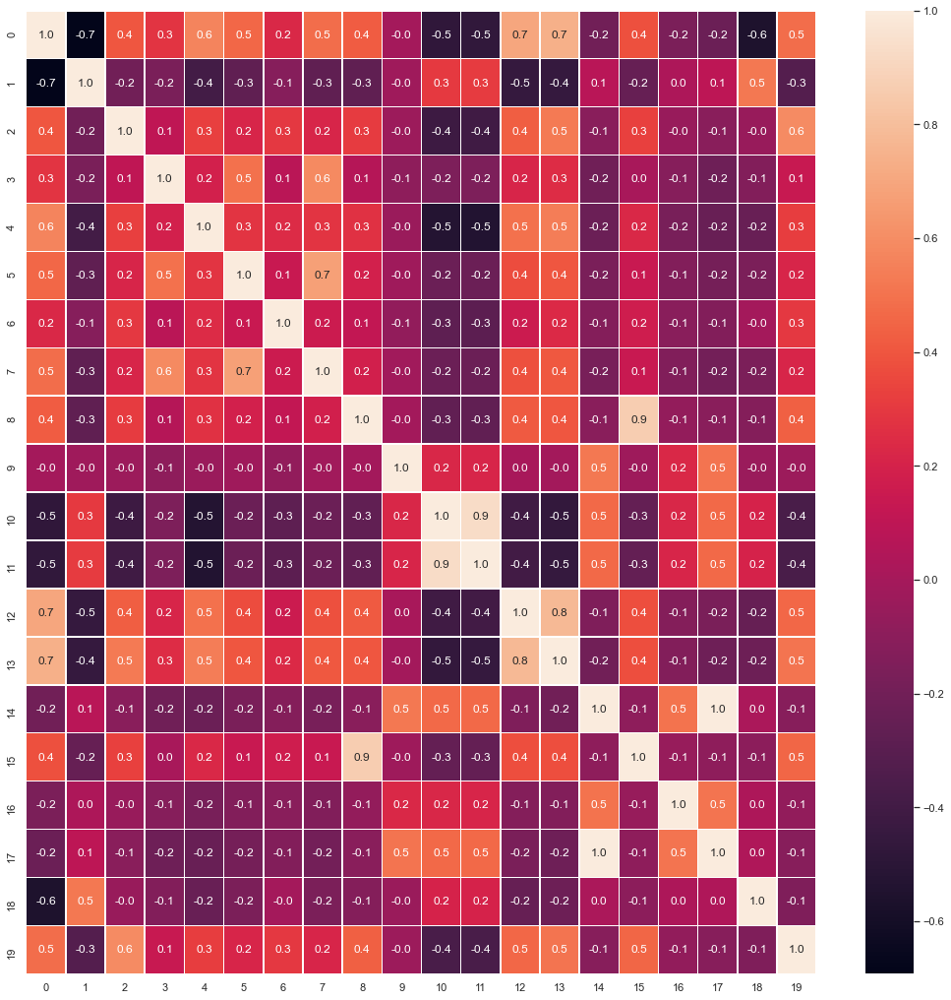

In [154]:
#correlation map
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(corrmatrix, annot=True, linewidths=.5, fmt= '.1f',ax=ax)


<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
<b>From heatmap we can see that features 8 and 15 , 14 and 17 , 10 and 11 are highly correlated</b>     </font>
            </div>
        </td>
    </tr>
</table>


In [155]:
feature_list = dict(zip(data2.columns,list(range(20))))
feature_list

{'RanLife expectancy ': 0,
 'RanAdult Mortality': 1,
 'RanAlcohol': 2,
 'RanHepatitis B': 3,
 'Ran BMI ': 4,
 'RanPolio': 5,
 'RanTotal expenditure': 6,
 'RanDiphtheria ': 7,
 'RanGDP': 8,
 'RanPopulation': 9,
 'Ran thinness  1-19 years': 10,
 'Ran thinness 5-9 years': 11,
 'RanIncome composition of resources': 12,
 'RanSchooling': 13,
 'infant deaths': 14,
 'percentage expenditure': 15,
 'Measles ': 16,
 'under-five deaths ': 17,
 ' HIV/AIDS': 18,
 'Status_encoded': 19}

In [156]:
plot_scatter_plot(data_encoded,features=['percentage expenditure' , 'GDP'])

In [157]:
plot_scatter_plot(data_encoded,features=[' thinness  1-19 years' , ' thinness 5-9 years'])

**From above scatter plot it is clear that varibles are features**

Remove variables that are correlated

In [158]:
data_no_corr = data2.drop('Ran thinness  1-19 years')
data_no_corr = data_no_corr.drop('percentage expenditure')
data_no_corr = data_no_corr.drop('under-five deaths ')

data_no_corr.columns

['RanLife expectancy ',
 'RanAdult Mortality',
 'RanAlcohol',
 'RanHepatitis B',
 'Ran BMI ',
 'RanPolio',
 'RanTotal expenditure',
 'RanDiphtheria ',
 'RanGDP',
 'RanPopulation',
 'Ran thinness 5-9 years',
 'RanIncome composition of resources',
 'RanSchooling',
 'infant deaths',
 'Measles ',
 ' HIV/AIDS',
 'Status_encoded']

In [159]:
len(data_no_corr.columns)

17

<a id="Data_Transformation"> </a>
## 7. Data Transformation


**To standardize data we need to convert them into a vector using vector assembler and then apply scaler**<br>
To do so we will use pipelining

In [160]:
X = data_no_corr.select("*").drop('RanLife expectancy ')
X.columns

['RanAdult Mortality',
 'RanAlcohol',
 'RanHepatitis B',
 'Ran BMI ',
 'RanPolio',
 'RanTotal expenditure',
 'RanDiphtheria ',
 'RanGDP',
 'RanPopulation',
 'Ran thinness 5-9 years',
 'RanIncome composition of resources',
 'RanSchooling',
 'infant deaths',
 'Measles ',
 ' HIV/AIDS',
 'Status_encoded']

In [161]:
assembler = VectorAssembler(inputCols = X.columns , outputCol="features")
scaler = MinMaxScaler(inputCol="features", outputCol="features_scaled")


In [162]:
pipeline = Pipeline(stages=[assembler, scaler])


In [163]:
scalerModel = pipeline.fit(data_no_corr)


In [164]:
scaled_data = scalerModel.transform(data_no_corr)

In [165]:
# drop unscaled vectors
scaled_data = scaled_data.drop("features")
scaled_data.select(['features_scaled' , 'RanLife expectancy ' ]).show(5)

+--------------------+-------------------+
|     features_scaled|RanLife expectancy |
+--------------------+-------------------+
|[0.36592178770949...|               65.0|
|[0.37709497206703...|               59.9|
|[0.37290502793296...|               59.9|
|[0.37849162011173...|               59.5|
|[0.38268156424581...|               59.2|
+--------------------+-------------------+
only showing top 5 rows



In [166]:
scaled_data.printSchema()

root
 |-- RanLife expectancy : double (nullable = true)
 |-- RanAdult Mortality: double (nullable = true)
 |-- RanAlcohol: double (nullable = true)
 |-- RanHepatitis B: double (nullable = true)
 |-- Ran BMI : double (nullable = true)
 |-- RanPolio: double (nullable = true)
 |-- RanTotal expenditure: double (nullable = true)
 |-- RanDiphtheria : double (nullable = true)
 |-- RanGDP: double (nullable = true)
 |-- RanPopulation: double (nullable = true)
 |-- Ran thinness 5-9 years: double (nullable = true)
 |-- RanIncome composition of resources: double (nullable = true)
 |-- RanSchooling: double (nullable = true)
 |-- infant deaths: long (nullable = true)
 |-- Measles : long (nullable = true)
 |--  HIV/AIDS: double (nullable = true)
 |-- Status_encoded: double (nullable = true)
 |-- features_scaled: vector (nullable = true)



In [167]:
finalized_data=scaled_data.select("features_scaled","RanLife expectancy ")
finalized_data.show(5)

+--------------------+-------------------+
|     features_scaled|RanLife expectancy |
+--------------------+-------------------+
|[0.36592178770949...|               65.0|
|[0.37709497206703...|               59.9|
|[0.37290502793296...|               59.9|
|[0.37849162011173...|               59.5|
|[0.38268156424581...|               59.2|
+--------------------+-------------------+
only showing top 5 rows



<a id="Linear_Regression"> </a>
## 8. Linear Regression


<table align="left">
    <tr>
        <td width="8%">
            <img src="key.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b> Now we build our linear model<br><br>
                        In order to build a model, we do the following:<br>
                        1. Split the data<br>
                        2. Build the model<br>
                        3. Make predictions<br>
                        4. Compute the accuracy measures<br>
                        5. Tabulate the results <br>
                      </b>
                </font>
            </div>
        </td>
    </tr>
</table>

<a id="Split_the_data"> </a>
#### 8.1 Split the data


In [168]:
train_data,test_data=finalized_data.randomSplit([0.75,0.25])


<a id="Build_the_model"> </a>
#### 8.2 Build the model


<i>Build the model</i>

In [169]:
regressor = LinearRegression(featuresCol='features_scaled', labelCol='RanLife expectancy ')

<i>fit the model</i>

In [170]:
regressor=regressor.fit(train_data)

<a id="Make_predictions"> </a>
#### 8.3 Make predictions


In [171]:
pred_results = regressor.evaluate(test_data)

<a id="Performance_measures"> </a>
#### 8.4 Performance measures


<i>Coeffients of linear regression mpdel</i>

In [172]:
regressor.coefficients

DenseVector([-13.9798, -0.5558, -1.923, 3.432, 2.3955, 2.5419, 5.9838, 4.8535, 2.0019, -1.752, 6.0761, 15.7758, -2.4573, -4.6599, -24.4636, 1.4388])

<i>intercept of linear regression mpdel</i>

In [173]:
regressor.intercept

53.041269828572176

In [174]:
regressor.summary.meanSquaredError

15.634357382256404

In [175]:
regressor.summary.r2

0.8225463719750379

In [176]:
regressor.summary.r2adj

0.8212083615846517

In [177]:
regressor.summary.rootMeanSquaredError

3.9540305236880005

<a id="Tabulate_Result"> </a>
#### 8.5 Tabulate Result


In [178]:
rows = [('Model' , 'R-squared' , 'Adj R-squared' , 'RMSE'),('Linear Regression' , str(regressor.summary.r2) ,  str(regressor.summary.r2adj) ,  str(regressor.summary.rootMeanSquaredError))]
result = spark.createDataFrame(data=rows)


<a id="model_cmp"> </a>
## 9. Model Comparision

In [179]:
result.show()

+-----------------+------------------+------------------+------------------+
|               _1|                _2|                _3|                _4|
+-----------------+------------------+------------------+------------------+
|            Model|         R-squared|     Adj R-squared|              RMSE|
|Linear Regression|0.8225463719750379|0.8212083615846517|3.9540305236880005|
+-----------------+------------------+------------------+------------------+



<table align="left">
    <tr>
        <td width="8%">
            <img src="note.png">
        </td>
        <td>
            <div align="left", style="font-size:120%">
                    <b>We have built a linear regression model in spark with RMSE score of 3.91796</b>
                </font>
            </div>
        </td>
    </tr>
</table>